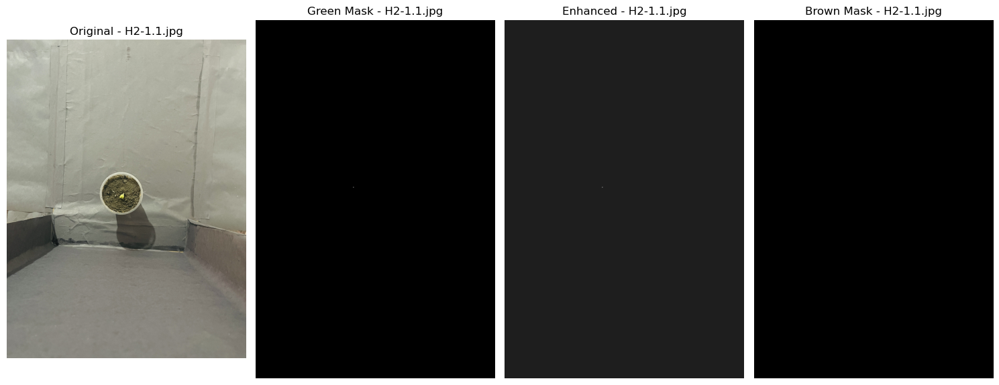

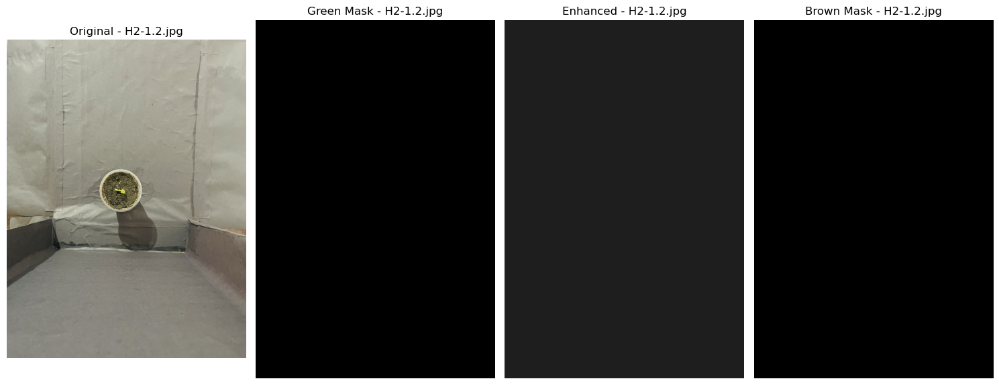

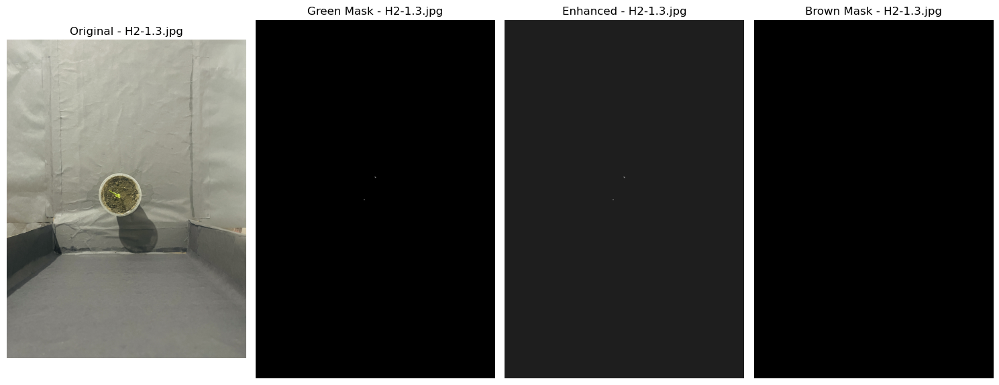

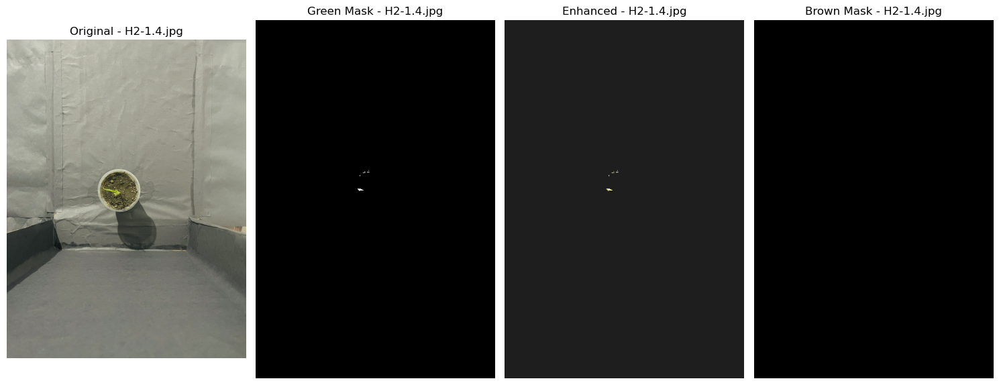

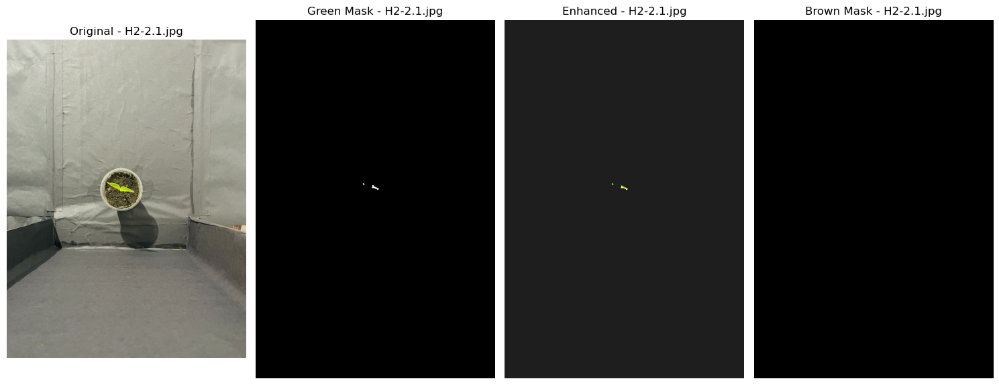

...

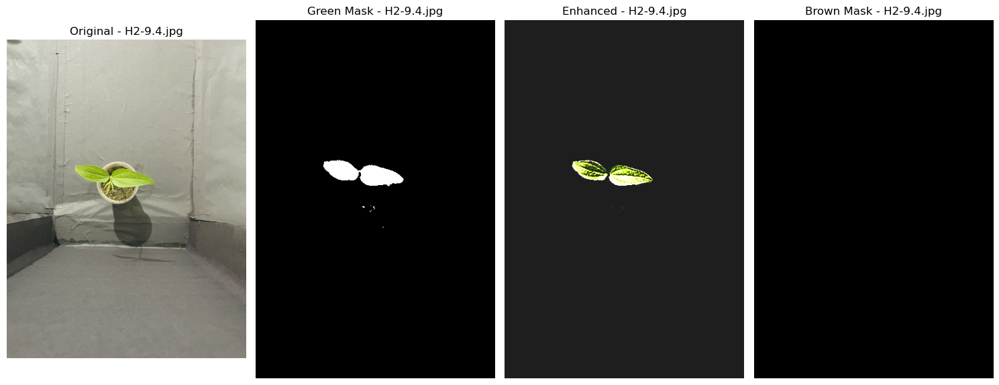

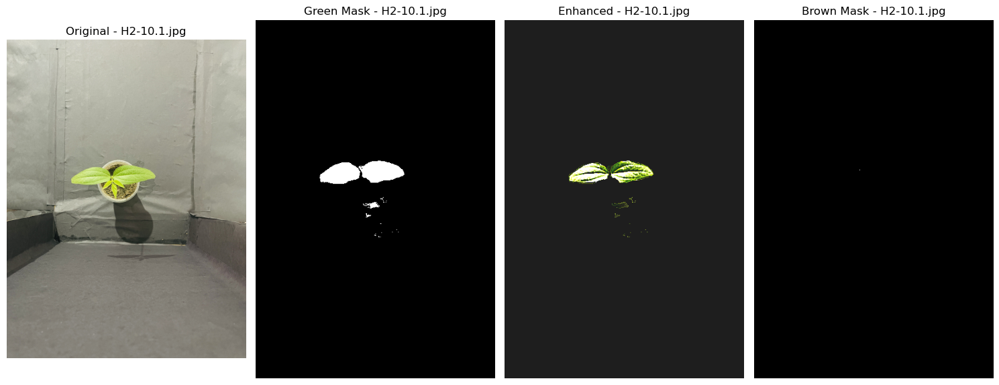

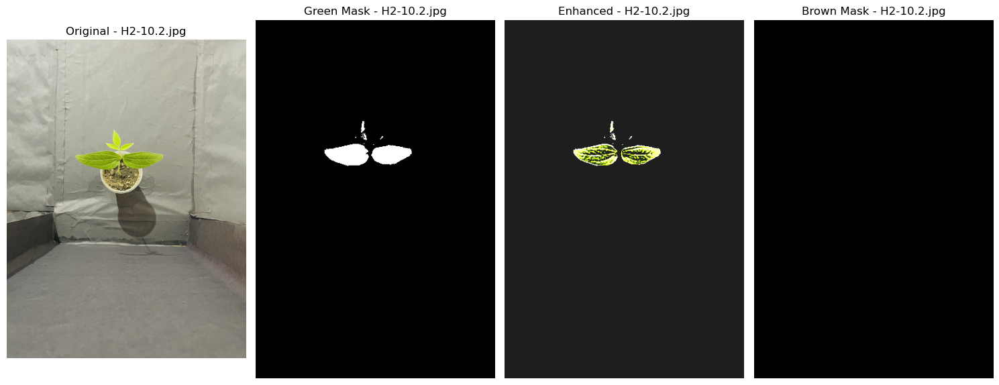

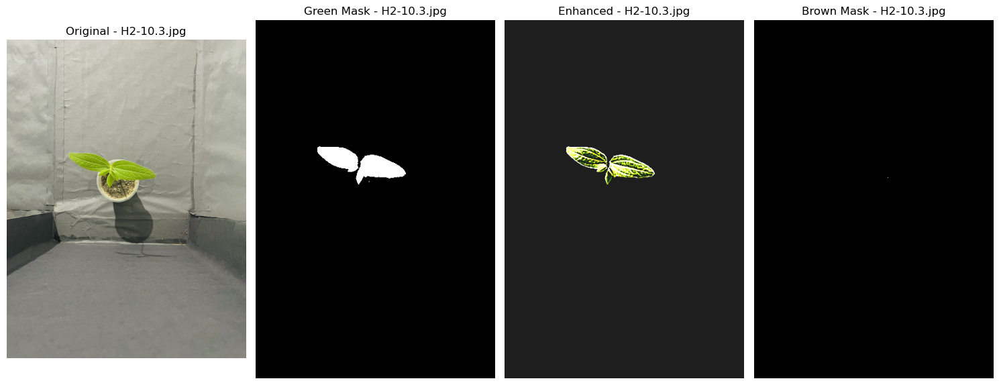

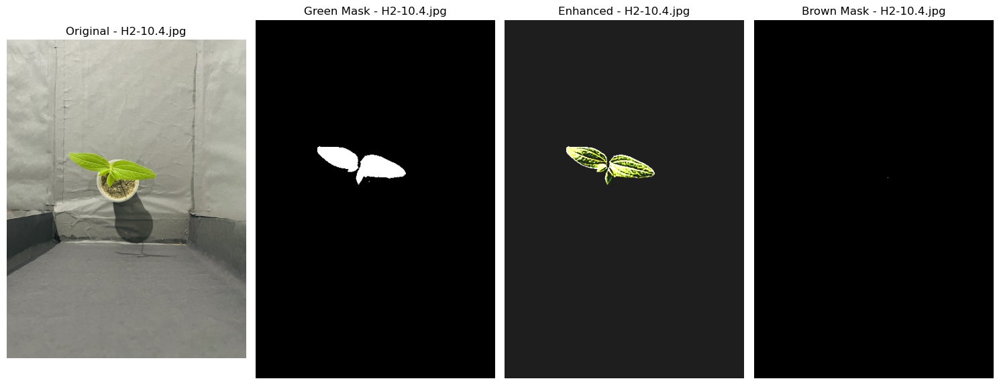

Image		Brown Discoloration(%)
H2-1.1.jpg	0.0
H2-1.2.jpg	0.0
H2-1.3.jpg	0.0
H2-1.4.jpg	0.0
H2-2.1.jpg	0.0
H2-2.2.jpg	0.0
H2-2.3.jpg	0.0
H2-2.4.jpg	0.0
H2-3.1.jpg	0.0
H2-3.2.jpg	0.0
H2-3.3.jpg	0.0
H2-3.4.jpg	0.0
H2-4.1.jpg	0.0
H2-4.2.jpg	0.0
H2-4.3.jpg	0.0
H2-4.4.jpg	0.0
H2-5.1.jpg	0.0
H2-5.2.jpg	0.0
H2-5.3.jpg	0.0
H2-5.4.jpg	0.0
H2-6.1.jpg	0.0
H2-6.2.jpg	0.0
H2-6.3.jpg	0.0
H2-6.4.jpg	0.0
H2-7.1.jpg	0.0
H2-7.2.jpg	0.0
H2-7.3.jpg	0.0
H2-7.4.jpg	0.0
H2-8.1.jpg	0.0
H2-8.2.jpg	0.0
H2-8.3.jpg	0.0
H2-8.4.jpg	0.0
H2-9.1.jpg	0.0
H2-9.2.jpg	0.0
H2-9.3.jpg	0.0
H2-9.4.jpg	0.0
H2-10.1.jpg	0.0
H2-10.2.jpg	0.0
H2-10.3.jpg	0.0
H2-10.4.jpg	0.0


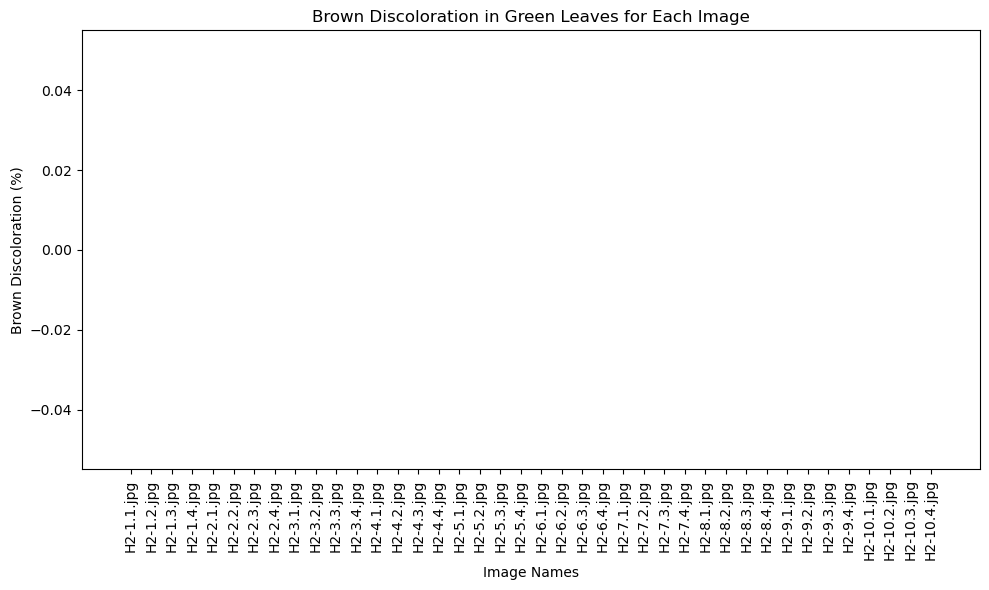

In [3]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

#List image names
image_names = [f"H2-{day}.{i}.jpg" for day in range(1, 11) for i in range(1, 5)]

#Folder path
folder_path = r"C:\Users\Sandeepa Sahil\Desktop\sample code\Discoloration"

#Preprocess image
def preprocess_image(img):
    resized = cv2.resize(img, (400, 600))  # Resize the image
    blurred = cv2.GaussianBlur(resized, (5, 5), 0)  # Apply Gaussian Blur
    return blurred

#enhance the image 
def enhance_for_brown_detection(img):
    #histogram equalization to improve contrast
    img_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)
    img_yuv[:, :, 0] = cv2.equalizeHist(img_yuv[:, :, 0]) 
    img_eq = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR)

    #Sharpen the image
    kernel = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])
    sharpened = cv2.filter2D(img_eq, -1, kernel)    
    #Adjust brightness and contrast
    alpha = 1.3  # Contrast control
    beta = 30    # Brightness control
    enhanced = cv2.convertScaleAbs(sharpened, alpha=alpha, beta=beta)

    return enhanced

#detect green leaves
def detect_green_leaves(img):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    #Green color range
    lower_green = np.array([35, 50, 50])  #Low hue
    upper_green = np.array([85, 255, 255])  #High hue
    green_mask = cv2.inRange(hsv, lower_green, upper_green)

    return green_mask

#detect brown discolored leaves
def detect_brown_discoloration(img):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    #Brown color range
    lower_brown = np.array([10, 50, 50])  #Low hue
    upper_brown = np.array([20, 150, 150])  #High hue
    brown_mask = cv2.inRange(hsv, lower_brown, upper_brown)                                                                 
    #Count brown pixels
    brown_pixels = cv2.countNonZero(brown_mask)
    total_pixels = img.shape[0] * img.shape[1]
    brown_percent = (brown_pixels / total_pixels) * 100

    return round(brown_percent, 2), brown_mask

#Store results
results = []
brown_percentages = []

#Loop through all images
for name in image_names:
    full_path = f"{folder_path}\\{name}"
    img = cv2.imread(full_path)
    if img is None:
        print(f"Image not found: {name}")
        continue
    #Preprocess the image
    preprocessed_img = preprocess_image(img)

    #Detect green leaves
    green_mask = detect_green_leaves(preprocessed_img)

    #focus only on the green regions
    green_img = cv2.bitwise_and(preprocessed_img, preprocessed_img, mask=green_mask)                   
    #Enhance the image for brown leaf detection
    enhanced_img = enhance_for_brown_detection(green_img)

    #Detect brown discoloration within the green leaves
    brown_discoloration, brown_mask = detect_brown_discoloration(enhanced_img)

    #Store the result
    results.append((name, brown_discoloration, enhanced_img, brown_mask))
    brown_percentages.append(brown_discoloration)

    
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  #BGR to RGB for display
    green_mask_rgb = cv2.cvtColor(green_mask, cv2.COLOR_GRAY2RGB)  #mask to RGB for display
    enhanced_rgb = cv2.cvtColor(enhanced_img, cv2.COLOR_BGR2RGB)  #Convert to RGB
    brown_mask_rgb = cv2.cvtColor(brown_mask, cv2.COLOR_GRAY2RGB)  #Convert mask to RGB for display
    
    plt.figure(figsize=(15, 6))

    #original image
    plt.subplot(1, 4, 1)
    plt.imshow(img_rgb)
    plt.title(f"Original - {name}")
    plt.axis('off')

    #green mask
    plt.subplot(1, 4, 2)
    plt.imshow(green_mask_rgb)
    plt.title(f"Green Mask - {name}")
    plt.axis('off')

    #enhanced image
    plt.subplot(1, 4, 3)
    plt.imshow(enhanced_rgb)
    plt.title(f"Enhanced - {name}")
    plt.axis('off')
    #brown discoloration mask
    plt.subplot(1, 4, 4)
    plt.imshow(brown_mask_rgb)
    plt.title(f"Brown Mask - {name}")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Display results in the console
print("Image\t\tBrown Discoloration(%)")
for r in results:
    print(f"{r[0]}\t{r[1]}")

#Plotting the results for brown discoloration percentages
plt.figure(figsize=(10, 6))
plt.bar(image_names, brown_percentages, color='brown')

#Adding labels and title
plt.xlabel('Image Names')
plt.ylabel('Brown Discoloration (%)')
plt.title('Brown Discoloration in Green Leaves for Each Image')#Rotate x-axis labels for better visibility
plt.xticks(rotation=90)

#Display the plot
plt.tight_layout()
plt.show()



